___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

In this assignment, you must apply ***EDA*** processes for the development of predictive models. Handling outliers, domain knowledge and feature engineering will be challenges. 

Also, this project aims to improve your ability to implement algorithms for ***Multi-Class Classification***. Thus, you will have the opportunity to implement many algorithms commonly used for Multi-Class Classification problems.

Before diving into the project, please take a look at the determines and tasks.

---
---

# #Determines

Dataset contains tree observations from four areas of one national forest district. This dataset includes information on tree type, shadow coverage, distance to nearby landmarks, soil type, and local topography. The goal of the project is to build a model that predicts what types of trees grow in an area.
***The Forest Dataset*** contains approximately 600 thousand lines, also you can easily find many information about it on the web (especially Kaggle).

---

To achieve high prediction success, you must understand the data well and develop different approaches that can affect the dependent variable.

Firstly, try to understand the dataset column by column using pandas module. Do research within the scope of domain (forest, trees) knowledge on the internet to get to know the data set in the fastest way. 

You should implement cleaning, handling with outliers and missing values using Pandas, NumPy and other required modules for the best result in modeling. You should do Feature Engineering.

After that, your final dataset with the new variables you have created will be ready for model building. You will implement ***Support Vector Machine, XGBoost, Random Forest, Desicion Tree*** algorithms. Also, evaluate the success of your models with appropriate performance metrics.

At the end of the project, create a chart comparing the performance of all models and choose the most successful model.


---
---

# #Tasks

#### 1. Exploratory Data Analysis (EDA)
- Import Libraries, Load Dataset, Exploring Data

    *i. Import Libraries*
    
    *ii. Load Dataset*
    
    *iii. Explore Data*

#### 2.  Data Cleaning
- Detect Missing Values and Outliers 

    *i. Missing Value Detection*
    
    *ii. Outlier Detection*
    
- Deal with Outliers
    
    *i. Drop Outliers*


#### 3. Feature Engineering


#### 4. Prediction (Multi-class Classification)
- Import libraries
- Data Preprocessing
- Implement SVM Classifer
- Implement Decision Tree Classifier
- Implement Random Forest Classifer
- Implement XGBoost Classifer
- Compare The Models



---
---

## 1. Exploratory Data Analysis

### Import Libraries, Load Dataset, Exploring Data

#### *i. Import Libraries*

Besides Numpy and Pandas, you need to import the necessary modules for data visualization, data preprocessing, Model building and tuning.

*Note: Check out the course materials.*

In [12]:
# libraries for EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

#Enabling the offline mode for interactive plotting locally
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
import plotly.io as pio
pio.renderers.default = "colab"

#To display the plots
%matplotlib inline

plt.rcParams["figure.figsize"] = (10, 6)
import warnings

warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

#### *ii. Load Dataset*

In [22]:
df = pd.read_csv("treetypes39k.csv")

#### *iii. Explore Data*
- Focus on numerical and categorical data
- Detect Number of Unique values of each column
- Focus on Target Variable (Cover_Type)
 - Detect relationships and correlations between independent variables and target variable.
 - It may be nice to visualize the class frequencies of the target variable.
- Detect relationships and correlations between independent variables. (You can prefer to keep only one of the highly correlated continuous variables.)
- Consider dropping features that contain little data or that you think will not contribute to the model.

In [23]:
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
0,3176,53,19,624,128,1620,227,195,94,3342,...,0,1,0,0,0,0,0,0,0,1
1,3221,77,11,626,46,4076,234,220,117,2761,...,0,0,0,0,0,0,0,0,0,1
2,3237,302,9,495,53,371,194,236,181,1784,...,0,0,0,0,0,0,0,0,0,1
3,3106,34,18,684,-65,4254,215,199,114,4325,...,0,0,0,0,0,0,0,0,0,1
4,3631,29,22,716,219,2851,206,186,107,1356,...,0,0,0,0,0,0,0,0,1,1


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39000 entries, 0 to 38999
Data columns (total 55 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Elevation                           39000 non-null  int64
 1   Aspect                              39000 non-null  int64
 2   Slope                               39000 non-null  int64
 3   Horizontal_Distance_To_Hydrology    39000 non-null  int64
 4   Vertical_Distance_To_Hydrology      39000 non-null  int64
 5   Horizontal_Distance_To_Roadways     39000 non-null  int64
 6   Hillshade_9am                       39000 non-null  int64
 7   Hillshade_Noon                      39000 non-null  int64
 8   Hillshade_3pm                       39000 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  39000 non-null  int64
 10  Wilderness_Area_1                   39000 non-null  int64
 11  Wilderness_Area_2                   39000 non-null  int64
 12  Wild

In [26]:
df.shape

(39000, 55)

In [27]:
df.duplicated().sum()

49

In [28]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Elevation,39000.000,2776.972,410.535,1866.000,2410.000,2801.000,3127.000,3856.000
Aspect,39000.000,156.404,110.004,0.000,64.000,125.000,261.000,360.000
Slope,39000.000,15.955,8.251,0.000,10.000,15.000,21.000,50.000
Horizontal_Distance_To_Hydrology,39000.000,234.294,213.230,0.000,67.000,182.000,336.000,1390.000
Vertical_Distance_To_Hydrology,39000.000,50.270,60.800,-139.000,5.000,32.000,78.000,561.000
Horizontal_Distance_To_Roadways,39000.000,1802.456,1379.395,0.000,787.000,1379.000,2451.250,7033.000
Hillshade_9am,39000.000,212.387,29.997,30.000,196.000,219.000,235.000,254.000
Hillshade_Noon,39000.000,219.254,22.275,85.000,207.000,223.000,235.000,254.000
Hillshade_3pm,39000.000,135.651,45.048,0.000,108.000,138.000,167.000,251.000
Horizontal_Distance_To_Fire_Points,39000.000,1575.898,1138.506,0.000,765.000,1318.000,2075.000,7111.000


In [29]:
df['Cover_Type'].value_counts()

1    7000
2    7000
3    5000
4    5000
5    5000
6    5000
7    5000
Name: Cover_Type, dtype: int64

In [39]:
for col in df.columns:
  print(col, "\n", df[col].nunique(), "\n--------")

Elevation 
 1804 
--------
Aspect 
 361 
--------
Slope 
 51 
--------
Horizontal_Distance_To_Hydrology 
 1158 
--------
Vertical_Distance_To_Hydrology 
 485 
--------
Horizontal_Distance_To_Roadways 
 5634 
--------
Hillshade_9am 
 184 
--------
Hillshade_Noon 
 150 
--------
Hillshade_3pm 
 250 
--------
Horizontal_Distance_To_Fire_Points 
 4948 
--------
Wilderness_Area_1 
 2 
--------
Wilderness_Area_2 
 2 
--------
Wilderness_Area_3 
 2 
--------
Wilderness_Area_4 
 2 
--------
Soil_Type_1 
 2 
--------
Soil_Type_2 
 2 
--------
Soil_Type_3 
 2 
--------
Soil_Type_4 
 2 
--------
Soil_Type_5 
 2 
--------
Soil_Type_6 
 2 
--------
Soil_Type_7 
 2 
--------
Soil_Type_8 
 2 
--------
Soil_Type_9 
 2 
--------
Soil_Type_10 
 2 
--------
Soil_Type_11 
 2 
--------
Soil_Type_12 
 2 
--------
Soil_Type_13 
 2 
--------
Soil_Type_14 
 2 
--------
Soil_Type_15 
 1 
--------
Soil_Type_16 
 2 
--------
Soil_Type_17 
 2 
--------
Soil_Type_18 
 2 
--------
Soil_Type_19 
 2 
--------
Soil_Typ

In [30]:
df.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area_1',
       'Wilderness_Area_2', 'Wilderness_Area_3', 'Wilderness_Area_4',
       'Soil_Type_1', 'Soil_Type_2', 'Soil_Type_3', 'Soil_Type_4',
       'Soil_Type_5', 'Soil_Type_6', 'Soil_Type_7', 'Soil_Type_8',
       'Soil_Type_9', 'Soil_Type_10', 'Soil_Type_11', 'Soil_Type_12',
       'Soil_Type_13', 'Soil_Type_14', 'Soil_Type_15', 'Soil_Type_16',
       'Soil_Type_17', 'Soil_Type_18', 'Soil_Type_19', 'Soil_Type_20',
       'Soil_Type_21', 'Soil_Type_22', 'Soil_Type_23', 'Soil_Type_24',
       'Soil_Type_25', 'Soil_Type_26', 'Soil_Type_27', 'Soil_Type_28',
       'Soil_Type_29', 'Soil_Type_30', 'Soil_Type_31', 'Soil_Type_32',
       'Soil_Type_33', 'Soil_Type_34', 'Soil_Type_35', 'Soil_Type_36',
       'Soil_Type_37', '

In [31]:
features = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Cover_Type']

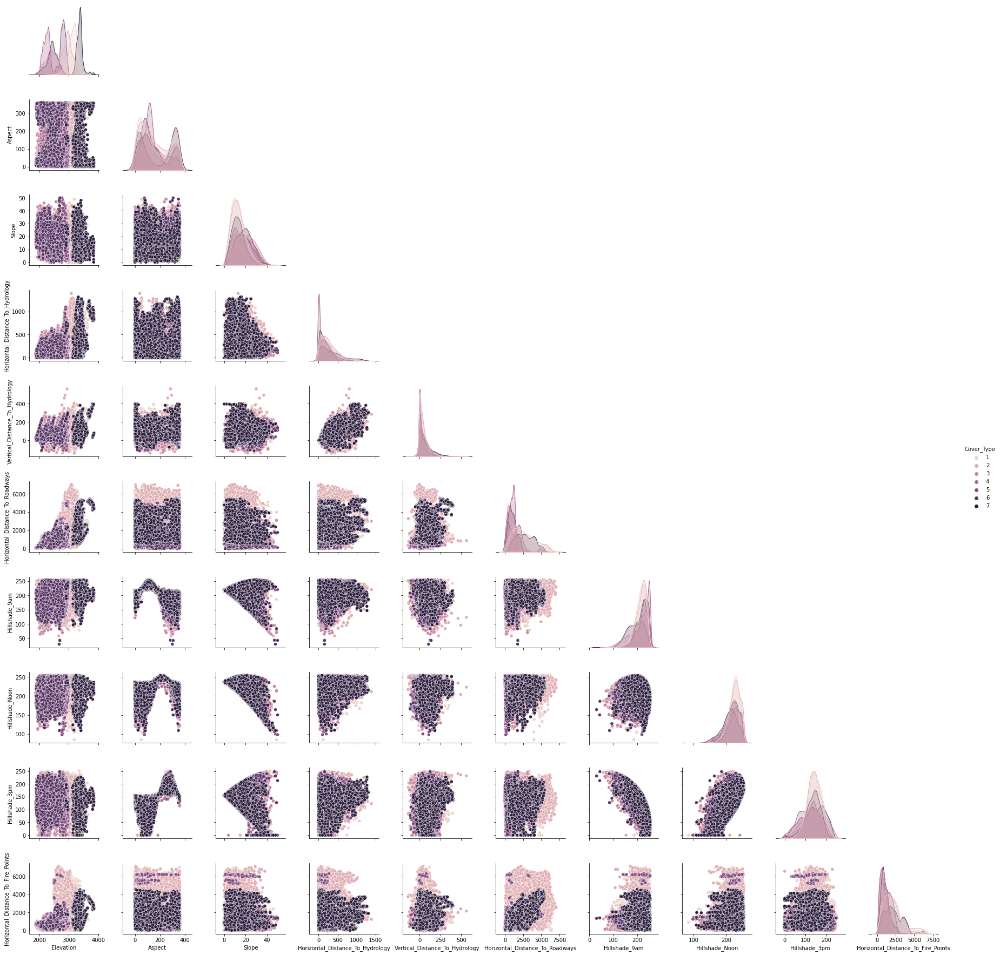

In [32]:
sns.pairplot(df[features], corner=True);

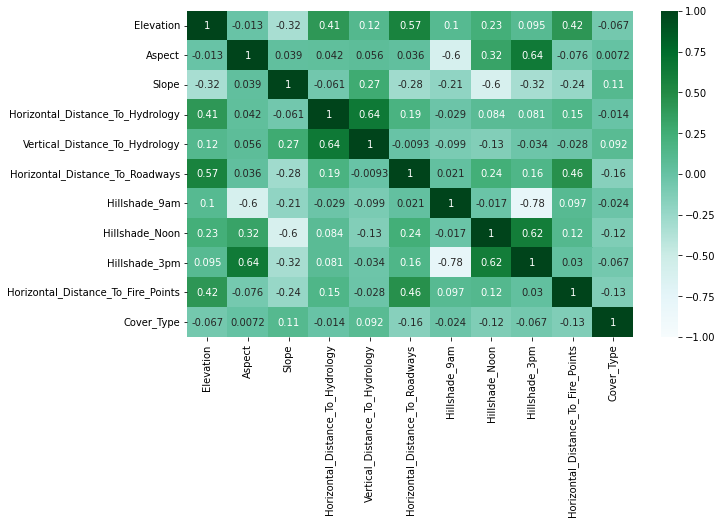

In [33]:
sns.heatmap(df[features].corr(), center=0, cmap="BuGn", annot=True, vmin=-1, vmax=1);

In [40]:
df.drop(columns="Soil_Type_15", index=1, inplace=True)

***
***

## 2.  Data Cleaning

### Detect Missing Values and Outliers

#### *i. Missing Value Detection*

In [25]:
df.isnull().sum().any()

False

#### *ii. Outlier Detection*

The columns which have continuous value should be examined in terms of [outliers](https://datascience.foundation/sciencewhitepaper/knowing-all-about-outliers-in-machine-learning) (Watch out for columns that look like continuous but not continuous!). Some algorithms are [sensitive to outliers](https://arsrinevetha.medium.com/ml-algorithms-sensitivity-towards-outliers-f3862a13c94d), but some algorithms can tolerate them. You can decide to outlier detection according to the algorithm you will use.
- You can check the outliers shape of continous features with respect to the target (Cover_Type) classes.
- You can check how many outliers are there of each continuous variables.
- The columns which have continuous value should be examined in terms of outliers.
- You can define a function to detect outliers in accordance with the ``zscore`` or ``IQR``.

In [41]:
features

['Elevation',
 'Aspect',
 'Slope',
 'Horizontal_Distance_To_Hydrology',
 'Vertical_Distance_To_Hydrology',
 'Horizontal_Distance_To_Roadways',
 'Hillshade_9am',
 'Hillshade_Noon',
 'Hillshade_3pm',
 'Horizontal_Distance_To_Fire_Points',
 'Cover_Type']

In [44]:
import plotly
import plotly.express as px
import cufflinks as cf

In [47]:
fig = px.box(df[features], color="Cover_Type", width=2000, height=500)
fig.show()

### Deal with Outliers

#### *ii. Drop Outliers*

In [48]:
def detect_outliers(df, col_name, tukey=1.5):
    '''
    this function detects outliers based on 1.5 time IQR and
    returns the number of lower and uper limit and number of outliers respectively
    '''
    first_quartile = np.percentile(np.array(df[col_name].tolist()), 25)
    third_quartile = np.percentile(np.array(df[col_name].tolist()), 75)
    IQR = third_quartile - first_quartile
    upper_limit = third_quartile+(tukey*IQR)
    lower_limit = first_quartile-(tukey*IQR)
    outlier_count = 0
    for value in df[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_count +=1
    return lower_limit, upper_limit, outlier_count

In [51]:
out_cols = []

for col in df[features]:
    
    if detect_outliers(df, col,3)[2] > 0 :
        out_cols.append(col)
        print(
        f"{col}\nlower:{detect_outliers(df, col,3)[0]} \nupper:{detect_outliers(df, col,3)[1]}\
        \noutlier:{detect_outliers(df, col,3)[2]}\n--------------"
    )
print(out_cols)

Horizontal_Distance_To_Hydrology
lower:-740.0 
upper:1143.0        
outlier:91
--------------
Vertical_Distance_To_Hydrology
lower:-214.0 
upper:297.0        
outlier:158
--------------
Hillshade_9am
lower:79.0 
upper:352.0        
outlier:12
--------------
Hillshade_Noon
lower:123.0 
upper:319.0        
outlier:34
--------------
Horizontal_Distance_To_Fire_Points
lower:-3165.0 
upper:6005.0        
outlier:309
--------------
['Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Hillshade_9am', 'Hillshade_Noon', 'Horizontal_Distance_To_Fire_Points']


In [52]:
tree1 = df.copy()

In [53]:
for col in out_cols:
    tree1 = tree1[(tree1[col] > detect_outliers(tree1, col)[0])
             & (tree1[col] < detect_outliers(tree1, col)[1])]

### Now, let's take a closer look at correlation of continuous columns.

***
***

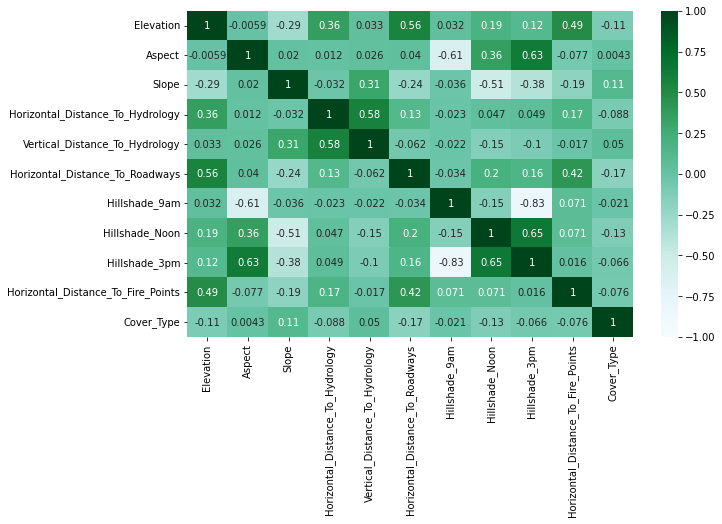

In [54]:
sns.heatmap(tree1[features].corr(), center=0, cmap="BuGn", annot=True, vmin=-1, vmax=1);

## 3. Feature Engineering

### My Plan of Feature Extraction
- First, I decided to produce&transform a new column with ``Horizontal_Distance_To_Hydrology`` and ``Vertical_Distance_To_Hydrology`` columns. New column will contain the values of **Hypotenuse** of ``horizantal`` and ``vertical`` distances.

- As second, we can produce&transform an additional column which contains **average** of Horizantal Distances to Hydrology and Roadways.

- Third, I decided to transform a new column which contains **average** of `Elevation` and ``Vertical_Distance_To_Hydrology`` columns. So that, there is no need to have ``Horizontal_Distance_To_Hydrology`` and ``Vertical_Distance_To_Hydrology`` columns, because I have new columns which represent more value than them. I decide to drop these columns.

- Note that, after seeing the result of the models, there may be a possibility of making minor changes to the features in the modeling phase.

***
***

## 4. Prediction (Multi-class Classification)

If you have done, use your data set resulting from Feature Engineering task. If you haven't done Feature Engineering, use the latest version of your data set.
In this section, you have two main tasks that apply to each algorithm:
1. Model Building and Prediction

 - SVM (Use ``LinearSVC`` model from``sklearn.svm`` module)
 - Decision Tree (Use ``DecisionTreeClassifier`` model from ``sklearn.tree`` module)
 - Random Forest (Use ``RandomForestClassifier`` model from ``sklearn.ensemble`` module) 
 - XGBoost (Use ``XGBClassifier`` model from``xgboost`` module)

2. Visualizing the Result

- Use [yellowbrick](https://www.scikit-yb.org/en/latest/), [seaborn](https://seaborn.pydata.org/tutorial/regression.html) or [matplotlib](https://matplotlib.org/) modules to visualize the model results.

- Show three plots for the results:
 - Class Prediction Error Bar Plot
 - Confusion Matrix
 - Classification Report

### Import Libraries

### Data Preprocessing

- Drop target variable
- Train-Test Split

*Note: You can use the train and test data generated here for all algorithms.*

### Implement Support Vector Machine
- Import the modul 
- Fit the model 
- Predict the test set
- Visualize and evaluate the result (use yellowbrick module)

*Note: You probably won't get a successful result. You may need to make some changes to the model or data. This may be a topic worth investigating, you decide.*

### Implement Decision Tree Classifier
- Import the modul 
- Fit the model 
- Predict the test set
- Visualize and evaluate the result (use yellowbrick module)

### Implement Random Forest Classifier
- Import the modul 
- Fit the model 
- Predict the test set
- Visualize and evaluate the result (use yellowbrick module)

### Implement XGBoost Classifer
- Import the modul 
- Fit the model 
- Predict the test set
- Visualize and evaluate the result (use yellowbrick module)

### Compare The Models

So far, you have created a multi-classifier model with 4 different algorithms and made predictions. You can observe the performance of the models together with a barplot of your choice.

- Which algorithm did you achieve the highest prediction performance with? 
- What could be the factors that cause this? What are the principles of the most successful algorithm and its differences from other algorithms? 

In contrast;

- Which algorithm did you achieve the lowest prediction performance with? 
- What could be the factors that cause this? What are the principles of the most successful algorithm and its differences from other algorithms? 

The answers you will look for to these questions will increase your gains from Machine Learning course.

# Accuracy Comparison

# F1 Score Comparison

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___